In [1]:
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from torchvision import transforms
from torchvision.io import read_image, ImageReadMode
from torch.utils.data import Dataset, DataLoader
import cv2
import os
import time
from copy import deepcopy
import matplotlib.pyplot as plt
import gc

print(torch.cuda.is_available())
if torch.cuda.is_available():
    print(torch.cuda.device_count())
    print(torch.cuda.get_device_name(torch.cuda.device_count()-1))

True
1
GeForce GTX 1050


In [2]:
def depth2Heatmap(depth_map, min_display=0, max_display=100):
    r = (np.max(depth_map) - np.min(depth_map)) / 10
    heatmap = np.zeros((*depth_map.shape, 3))
    for i in range(depth_map.shape[0]):
        for j in range(depth_map.shape[1]):
            if not min_display < depth_map[i,j] < max_display:
                continue
#             if depth_map[i,j] < 5:
#                 heatmap[i,j] = np.array([100,0,100])
            if depth_map[i,j] < r:
                heatmap[i,j,2] = 255 - depth_map[i,j] / r * 255    
                heatmap[i,j,0] = depth_map[i,j] / r * 255           
            elif r < depth_map[i,j] < 5*r:
                heatmap[i,j,0] = 255 - (depth_map[i,j]-r) / (4*r) * 255               
                heatmap[i,j,1] = (depth_map[i,j]-r) / (4*r) * 255  
            else:
                heatmap[i,j,1] = 255 - (depth_map[i,j]-4*r) / (6*r) * 255                                        
                heatmap[i,j,2] = (depth_map[i,j]-4*r) / (6*r) * 255  
    heatmap[:,:,0] *= 15
    return heatmap.astype(np.int64)


def drawHeatmap(depth_map, min_display=0, max_display=100):
    h = depth2Heatmap(depth_map, min_display=0, max_display=100)
    
    plt.figure(figsize=(20,10))
    plt.imshow(h)
    x = np.arange(70).reshape(1, -1)
    x = np.vstack((x,x,x))
    hb = depth2Heatmap(x)
    plt.figure()
    plt.imshow(hb)    

In [12]:
def read2Tensor(img_path, device):
    img_t = read_image(img_path).to(torch.float32).unsqueeze(0).to(device)
    transform = transforms.Compose([transforms.Resize( (120, 480) ),
                   transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))])
    img_t = transform(img_t)  
    return img_t

def readLabel2Tensor(label_path, device=torch.device("cuda" if torch.cuda.is_available() else "cpu")):
    label_t = read_image(label_path).to(torch.float32).unsqueeze(0).to(device)
    transform = transforms.Compose([transforms.Resize( (120, 480) )])
    label_t = transform(label_t)  
    return label_t    

def pred2Img(pred):
    pred = pred.squeeze(0)
    pred = pred.squeeze(0)
    pred = pred.to("cpu").to(torch.uint8)
    return pred

class KITTI_DEP(Dataset):
    '''
    @note assume that label image's name and corresponding rgb image's name are the same
    just in different folders. e.g. labels/1.jpg <---> rgbs/1.jpg
    '''
    def __init__(self, rgb_dir_paths, label_dir_paths, transform=transforms.Compose([transforms.Resize( (135, 540) ),
                                          transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))]),
                          target_transform=transforms.Compose([transforms.Resize( (135, 540) )]),
                          device=torch.device("cuda:0" if torch.cuda.is_available() else "cpu"), qmark=True, original=False):
        self.rgb_dir_paths = rgb_dir_paths
        self.label_dir_paths = label_dir_paths
        
        self.data_pair_paths = []
        for rgb_dir_path, label_dir_path in zip(rgb_dir_paths, label_dir_paths):
            data_names = sorted(os.listdir(label_dir_path))
            for data_name in data_names:
                img_path = os.path.join(rgb_dir_path, data_name)
                label_path = os.path.join(label_dir_path, data_name)   
                self.data_pair_paths.append((img_path, label_path))
        
        self.transform = transform
        self.target_transform = target_transform
        
        self.device = device
        self.qmark = qmark
        self.original = original

    def __len__(self):
        return len(self.data_pair_paths)

    def __getitem__(self, idx):
        img_path, label_path = self.data_pair_paths[idx]
           
        if self.qmark:
            img =  cv2.imread(img_path)
            img = transforms.ToTensor()(img)

            label = cv2.imread(label_path)
            label = label[:,:,0]
            label = label.reshape(1, *label.shape)
            label = torch.tensor(label).to(torch.float32)
        else:
            img = read_image(img_path)
            img = img.to(torch.float32)
                      
            label = read_image(label_path).to(torch.float32)
        img = img.to(self.device)  
        label = label.to(self.device)
        
        if self.transform:
            img = self.transform(img)
        if self.target_transform:
            label = self.target_transform(label)

        if self.original:
            original_img = cv2.imread(img_path)     
            original_label = cv2.imread(label_path)[:,:,0]        
        else:
            original_img = torch.empty(1)
            original_label = torch.empty(1)                     
            
        data = {}
        data['rgb'] = img
        data['label'] = label
        data['original_rbg'] = original_img
        data['original_label'] = original_label
            
        return data
    
    def example(self, idx=10):
        data = self.__getitem__(idx)
        image = data['rgb']
        label = data['label']
        original_image = data['original_rbg']
        original_label = data['original_label']
        print("data", image.shape, image.dtype, label.shape, label.dtype)           
        
        image = image.permute(1, 2, 0).to("cpu").to(torch.uint8)
        label = label.permute(1, 2, 0).to("cpu").to(torch.uint8).squeeze(2).numpy()
        
        print("data", label.shape, label.dtype)                   
        
        plt.figure(figsize=(20, 10))
        plt.imshow(image)
        plt.figure(figsize=(20, 10))
        plt.imshow(original_image)        
#         plt.figure(figsize=(20, 10))
#         plt.imshow(label)    
        drawHeatmap(label)
        drawHeatmap(original_label)
        

In [32]:
DATA_PATH = "../../data/data_depth_self_compiled"
TRAIN_PATH = os.path.join(DATA_PATH, "training")
TRAIN_RGB_PATH = os.path.join(TRAIN_PATH, "rgb")
TRAIN_LABEL_PATH = os.path.join(TRAIN_PATH, "label")
TRAIN_RGB_PATHS = [os.path.join(TRAIN_RGB_PATH, "0001"),
                   os.path.join(TRAIN_RGB_PATH, "0002"),
                   os.path.join(TRAIN_RGB_PATH, "0009"),
                   os.path.join(TRAIN_RGB_PATH, "0011"),
                   os.path.join(TRAIN_RGB_PATH, "0017"),
                   os.path.join(TRAIN_RGB_PATH, "0018"),
                   os.path.join(TRAIN_RGB_PATH, "0048"),
                   os.path.join(TRAIN_RGB_PATH, "0051")]

TRAIN_DEP_PATHS = [os.path.join(TRAIN_LABEL_PATH, "0001"),
                   os.path.join(TRAIN_LABEL_PATH, "0002"),
                   os.path.join(TRAIN_LABEL_PATH, "0009"),
                   os.path.join(TRAIN_LABEL_PATH, "0011"),
                   os.path.join(TRAIN_LABEL_PATH, "0017"),
                   os.path.join(TRAIN_LABEL_PATH, "0018"),
                   os.path.join(TRAIN_LABEL_PATH, "0048"),
                   os.path.join(TRAIN_LABEL_PATH, "0051")]

TEST_PATH = os.path.join(DATA_PATH, "testing")
TEST_RGB_PATH = os.path.join(TEST_PATH, "rgb")
TEST_DEP_PATH = os.path.join(TEST_PATH, "label")
TEST_RGB_PATH1 = TRAIN_RGB_PATHS[0]
TEST_DEP_PATH1 = TRAIN_DEP_PATHS[0]

dataset = KITTI_DEP(TRAIN_RGB_PATHS, TRAIN_DEP_PATHS, device=torch.device("cuda"), qmark=True, original=True)
dataloader = DataLoader(dataset, batch_size=16, shuffle=False, num_workers=0)

# dataset.example(519)
# print('len', len(dataset))
# tic = time.time()
# for i, data in enumerate(dataloader):
#     print("data rgb", data['rgb'].shape)
#     if i > 10:
#         break
# print("time", time.time() - tic)

In [5]:
class HorizontalBlock(nn.Module):
    def __init__(self, input_dim, output_dim):
        super().__init__()
        self.conv1 = nn.Conv2d(input_dim, output_dim, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(output_dim, output_dim, kernel_size=3, padding=1)
        self.relu = nn.LeakyReLU(inplace=True)
        self.bn = nn.BatchNorm2d(output_dim)
    
    def forward(self, x):
        x = self.conv1(x)
        x = self.bn(x)
        x = self.relu(x)
        x = self.conv2(x)
        x = self.bn(x)
        x = self.relu(x)
        return x

class DownBlock(nn.Module):
    def __init__(self):
        super().__init__()
        self.max_pool = nn.MaxPool2d(2)
        
    def forward(self, x):
        return self.max_pool(x)
    
class UpBlock(nn.Module):
    def __init__(self, input_dim):
        super().__init__()        
        self.tconv = nn.ConvTranspose2d(input_dim, input_dim//2, kernel_size=2, stride=2)
    
    def forward(self, x):
        x = self.tconv(x)
        return x
    
class ContractPath(nn.Module):
    def __init__(self, input_dim):
        super().__init__()        
        self.hb1 = HorizontalBlock(input_dim, 64)
        self.hb2 = HorizontalBlock(64, 128)
        self.hb3 = HorizontalBlock(128, 256)
        self.hb4 = HorizontalBlock(256, 512) 
        self.hb5 = HorizontalBlock(512,1024)         
        
        self.db = DownBlock()
        
    def forward(self, x):
        x1 = self.hb1(x)
        x1c = self.db(x1)
        
        x2 = self.hb2(x1c)
        x2c = self.db(x2)
        
        x3 = self.hb3(x2c)
        x3c = self.db(x3)
        
        x4 = self.hb4(x3c)
        x4c = self.db(x4) 
        
        x5 = self.hb5(x4c)
        return x5, x4, x3, x2, x1
    
class ExpandPath(nn.Module):
    def __init__(self, output_dim):
        super().__init__()        
        self.hb1 = HorizontalBlock(1024, 512)        
        self.hb2 = HorizontalBlock(512, 256)
        self.hb3 = HorizontalBlock(256, 128)
        self.hb4 = HorizontalBlock(128, 64)
        self.out_conv = nn.Conv2d(64, output_dim, kernel_size=1)
        
        self.ub1 = UpBlock(1024)
        self.ub2 = UpBlock(512)
        self.ub3 = UpBlock(256)
        self.ub4 = UpBlock(128)
        
    def forward(self, cp):
        x = cp[0]
        x = self.ub1(x) #512
        
        x_padded = torch.zeros(*cp[1].shape, device=x.device)
        x_padded[:,:,:x.shape[2],:x.shape[3]] = x
        x = torch.cat((x_padded, cp[1]), 1) #1024
        x = self.hb1(x) #512
        x = self.ub2(x) #256
                
        x_padded = torch.zeros(*cp[2].shape, device=x.device)
        x_padded[:,:,:x.shape[2],:x.shape[3]] = x        
        x = torch.cat((x_padded, cp[2]), 1) #512
        x = self.hb2(x) #256
        x = self.ub3(x) #128
        
        x_padded = torch.zeros(*cp[3].shape, device=x.device)
        x_padded[:,:,:x.shape[2],:x.shape[3]] = x
        x = torch.cat((x_padded, cp[3]), 1) #256
        x = self.hb3(x) #128
        x = self.ub4(x) #64   
        
        x_padded = torch.zeros(*cp[4].shape, device=x.device)
        x_padded[:,:,:x.shape[2],:x.shape[3]] = x
        x = torch.cat((x_padded, cp[4]), 1) #128
        x = self.hb4(x) #64
        
        x = self.out_conv(x) #num class
        
        return x
                    
    
class UNet(nn.Module):
    def __init__(self, input_dim, num_class):
        super().__init__()                
        self.cp = ContractPath(input_dim)
        self.ep = ExpandPath(num_class)

    def forward(self, x):
        feat_maps = self.cp(x)
        y = self.ep(feat_maps)
        return y
        
    
x = torch.randn(1, 3, 160, 640)
unet = UNet(3, 70)
y = unet(x)
print(y.shape)

C:\Users\24488\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  ..\c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


torch.Size([1, 70, 160, 640])


In [6]:
loss_fn = nn.CrossEntropyLoss()

y = torch.randint(33, (10, 480, 360))
x = torch.randn(10, 33, 480, 360)
print(x.shape, y.shape)
z = loss_fn(x, y)
z

torch.Size([10, 33, 480, 360]) torch.Size([10, 480, 360])


tensor(3.9713)

In [7]:
def depMapGradMask(label):
    mask = torch.ones_like(label)
    mask[label == 0] = 0
    return mask

x = torch.tensor([[1,0,3],
                  [4,5,0]])
y = depMapGradMask(x)
y

tensor([[1, 0, 1],
        [1, 1, 0]])

In [52]:
def checkMem():
    t = torch.cuda.get_device_properties(0).total_memory
    r = torch.cuda.memory_reserved(0)
    a = torch.cuda.memory_allocated(0)
    f = r-a  # free inside reserved  
    a /= 1024 * 1024
    return a

def train(model, dataloader, regression, num_epoch=400, device=torch.device("cuda" if torch.cuda.is_available() else "cpu")):
    optimizer = torch.optim.SGD(model.parameters(), lr=0.001, momentum=0.9)    
    loss_fn = nn.CrossEntropyLoss()
    best_record = np.inf
    hist = []
    for epoch in range(num_epoch):
        running_loss = 0        
        tic = time.time()
        for batch_idx, data in enumerate(dataloader):
            imgs = data['rgb'].to(device)
            labels = data['label'].to(device)
            
            if regression:
                labels = labels.squeeze(1).to(torch.int64)

            print("batch", batch_idx, "/", len(dataloader), end='\n')
            pred = model(imgs)
#             print("imgs", imgs.shape, "labels", labels.dtype, "pred", pred.dtype)
            loss = loss_fn(pred, labels)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()        
            
            running_loss += loss.item() / len(dataloader)           
            
        toc = time.time()
        hist.append(running_loss)
            
        if epoch % 1 == 0:
            print("epoch", epoch)
            print("epoch", epoch, "takes", toc-tic)
            print("running loss", running_loss)
            print("-"*50)

        if best_record > running_loss:
            print("best record", best_record)
            best_record = running_loss
            best_model = deepcopy(model)
        
        if epoch % 50 == 47:
            model_path = "trained_model_dep_"+str(epoch)+".pth"
            torch.save(best_model, model_path)
            # files.download(model_path)
          
            plt.figure()
            plt.plot(hist)
            plt.savefig(str(epoch)+".jpg")
            testViz(best_model, TEST_RGB_PATH, TEST_DEP_PATH, name=str(epoch))
            
    return best_model
        
def testViz(model, test_rbg_path, test_dep_path, save_dir, device=torch.device("cpu"), num_example=5, name="name"):
    model = model.to(device)
    test_img_names = sorted(os.listdir(test_rbg_path))
    test_label_names = sorted(os.listdir(test_dep_path))
    for i in range(num_example):
        img_path = os.path.join(TEST_RGB_PATH, test_img_names[(len(test_img_names)-1)//num_example*i])
        img_t = read2Tensor(img_path, device)
        img = cv2.imread(img_path)
        img = cv2.resize(img, (540, 135))

        label_path = os.path.join(TEST_DEP_PATH, test_label_names[(len(test_img_names)-1)//num_example*i])
        label = cv2.imread(label_path)
        label = label[:,:,0]
        label = cv2.resize(label, (540, 135))

        tic = time.time()
        pred = model(img_t).squeeze(0)
        pred = torch.argmax(pred, dim=0)
        pred = pred2Img(pred)
        toc = time.time()
        print("inference takes", toc-tic)

        plt.figure(figsize=(20,10))
        plt.imshow(img)
        plt.title("img"+str(i))
        plt.savefig(os.path.join(save_dir, name+"img"+str(i)+".png"))
        
        label_h = depth2Heatmap(label)
        plt.figure(figsize=(20,10))
        plt.imshow(label_h) 
        plt.title("label"+str(i)) 
        plt.savefig(os.path.join(save_dir, name+"label"+str(i)+".png"))    
        
        pred_h = depth2Heatmap(pred.numpy())        
        plt.figure(figsize=(20,10))
        plt.imshow(pred_h)
        plt.title("pred"+str(i)) 
        plt.savefig(os.path.join(save_dir, name+"pred"+str(i)+".png"))        


        if i+1 >= num_example:
            break

# TRAINED_MODELS_PATH = os.path.join(DATA_PATH, "trained_models")
# trained_model_path = os.path.join(TRAINED_MODELS_PATH, "trained_model99.pth")
# model = torch.load(trained_model_path)
# testViz(model)

inference takes 0.6033861637115479


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inference takes 0.6821761131286621


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inference takes 0.6243293285369873


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inference takes 0.6422812938690186


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


inference takes 0.6512575149536133


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


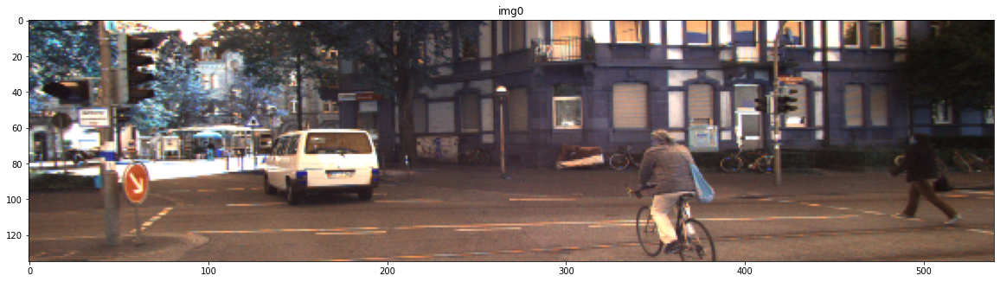

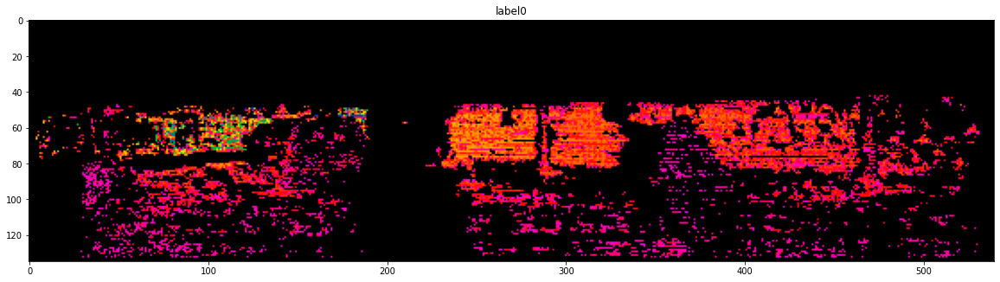

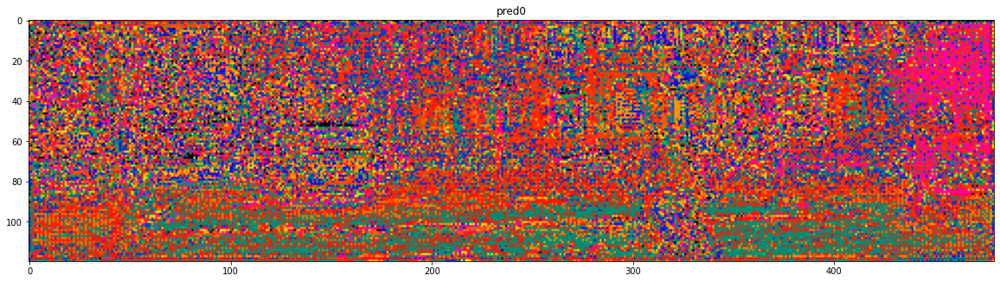

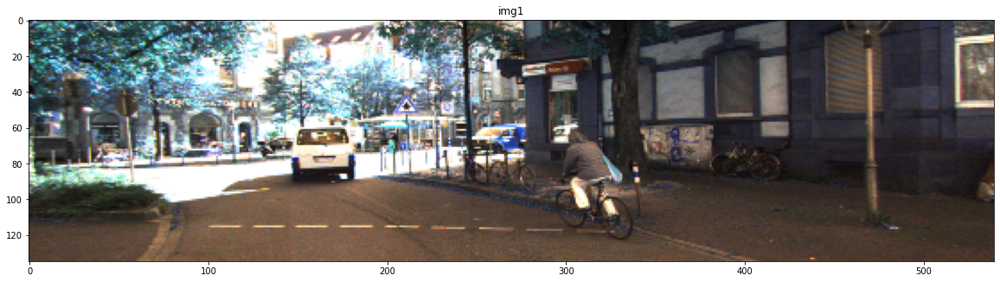

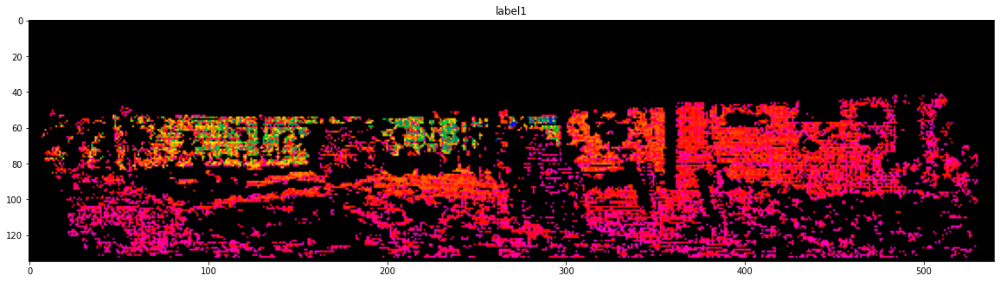

...

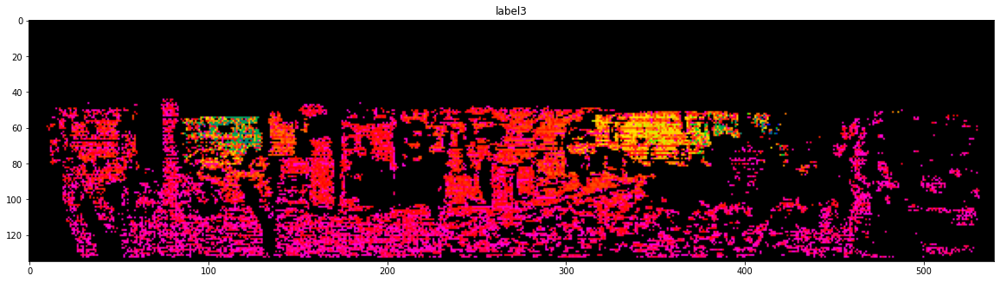

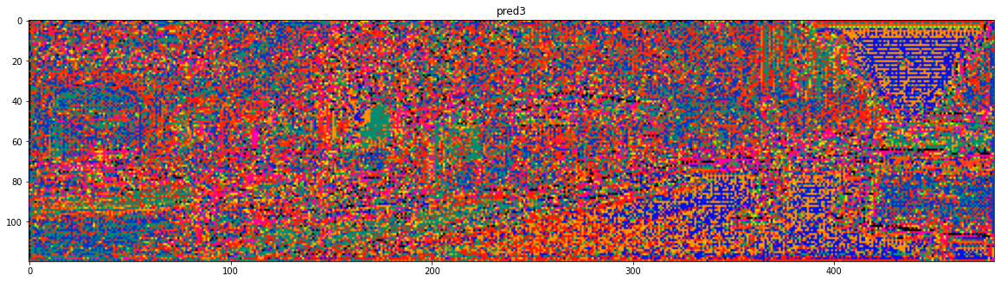

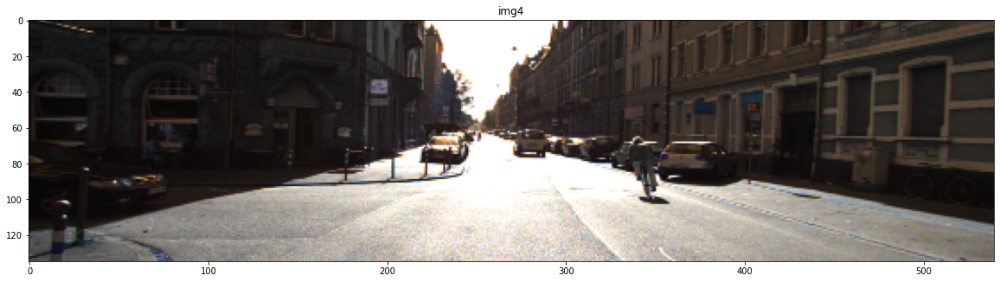

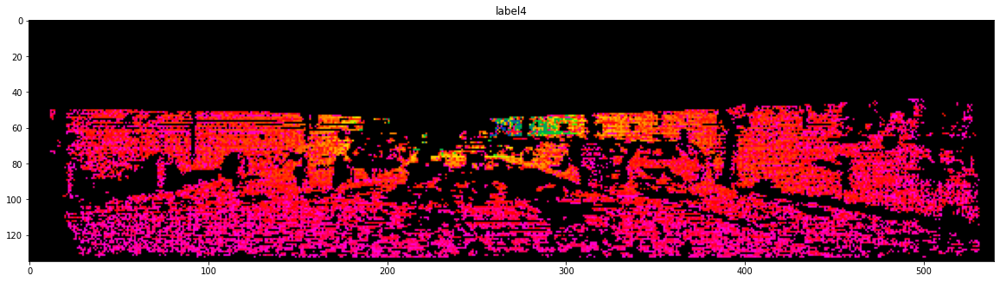

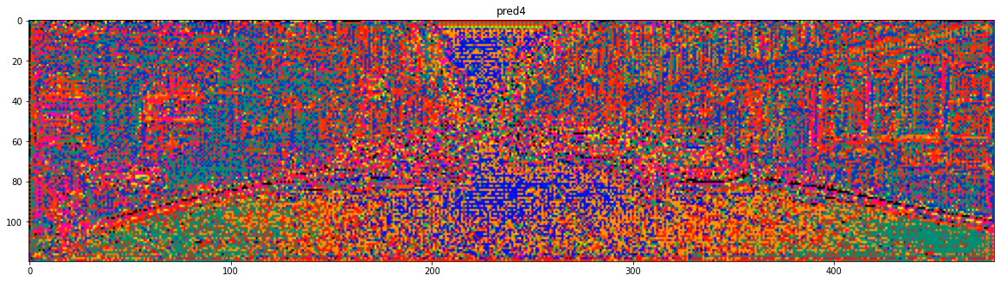

In [51]:
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")        
model_device = torch.device("cuda")   
data_device = device = torch.device("cpu")       

dataset = KITTI_DEP(TRAIN_RGB_PATHS, TRAIN_DEP_PATHS, device=data_device, qmark=True)
dataloader = DataLoader(dataset, batch_size=1, shuffle=True, num_workers=0)

unet = UNet(3, 85).to(model_device)
# model = train(unet, dataloader, True, device=model_device)
testViz(unet, TEST_RGB_PATH, TEST_DEP_PATH, "plots")

In [ ]:
model = torch.load("/content/trained_model_dep397.pth")
testViz(model)